In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

In [21]:
data = pd.read_csv(r"C:\Users\saikr\Rainfall_Prediction\Weather.csv")
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,@dropdown
0,2008-12-01,Delhi,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,NaN
1,2008-12-02,Delhi,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,NaN
2,2008-12-03,Delhi,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,NaN
3,2008-12-04,Delhi,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,NaN
4,2008-12-05,Delhi,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,NaN


In [3]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical columns
label_enc = LabelEncoder()
for col in data.select_dtypes(include='object').columns:
    data[col] = label_enc.fit_transform(data[col])

# Now you can calculate correlation
data.corr()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,@dropdown
Date,1.000000,0.020198,0.021058,0.044122,-0.012234,0.082058,0.011873,-0.027787,-0.024008,-0.014610,...,-0.011186,0.033577,0.027200,0.065445,0.042758,0.031361,0.031906,0.005478,0.009970,NaN
Location,0.020198,1.000000,-0.008558,-0.022942,-0.003248,0.042106,0.003130,-0.019642,0.073542,-0.022885,...,0.013491,0.036423,0.046712,-0.011154,-0.018843,-0.018252,-0.025967,0.010714,0.017005,NaN
MinTemp,0.021058,-0.008558,1.000000,0.736555,0.103938,0.466993,0.072586,-0.125465,0.177415,-0.125108,...,0.006089,-0.450970,-0.461292,0.078754,0.021605,0.901821,0.708906,0.053249,0.078237,NaN
MaxTemp,0.044122,-0.022942,0.736555,1.000000,-0.074992,0.587932,0.470156,-0.206774,0.067615,-0.247524,...,-0.508855,-0.332061,-0.427167,-0.289370,-0.277921,0.887210,0.984503,-0.202647,-0.140369,NaN
Rainfall,-0.012234,-0.003248,0.103938,-0.074992,1.000000,-0.064351,-0.227549,0.044790,0.133659,0.065656,...,0.255755,-0.168154,-0.126534,0.198528,0.172403,0.011192,-0.079657,0.501516,0.222549,NaN
Evaporation,0.082058,0.042106,0.466993,0.587932,-0.064351,1.000000,0.365602,-0.091455,0.203021,-0.124414,...,-0.390243,-0.270362,-0.293581,-0.183793,-0.182618,0.545115,0.572893,-0.173909,-0.105260,NaN
Sunshine,0.011873,0.003130,0.072586,0.470156,-0.227549,0.365602,1.000000,-0.087145,-0.034750,-0.113812,...,-0.629130,0.041970,-0.019719,-0.675323,-0.703930,0.291188,0.490501,-0.301930,-0.405503,NaN
WindGustDir,-0.027787,-0.019642,-0.125465,-0.206774,0.044790,-0.091455,-0.087145,1.000000,0.142169,0.361995,...,0.074583,-0.119386,-0.028872,0.078101,0.069413,-0.168893,-0.220273,0.125907,0.081040,NaN
WindGustSpeed,-0.024008,0.073542,0.177415,0.067615,0.133659,0.203021,-0.034750,0.142169,1.000000,-0.051322,...,-0.026327,-0.458744,-0.413749,0.071736,0.109168,0.150150,0.032748,0.145569,0.216299,NaN
WindDir9am,-0.014610,-0.022885,-0.125108,-0.247524,0.065656,-0.124414,-0.113812,0.361995,-0.051322,1.000000,...,0.164415,0.029780,0.109646,0.112269,0.066921,-0.202709,-0.250056,0.142918,0.035963,NaN


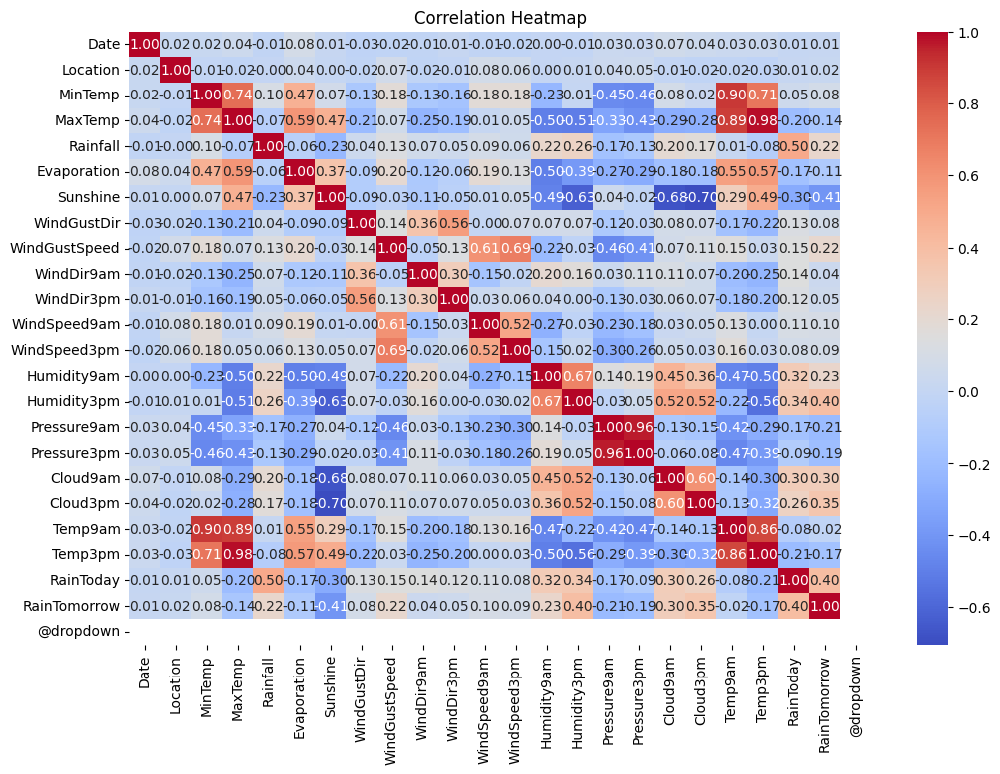

In [5]:

# Select only numeric columns
numeric_data = data.select_dtypes(include='number')

# Calculate correlation
corr_matrix = numeric_data.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap")
plt.show()


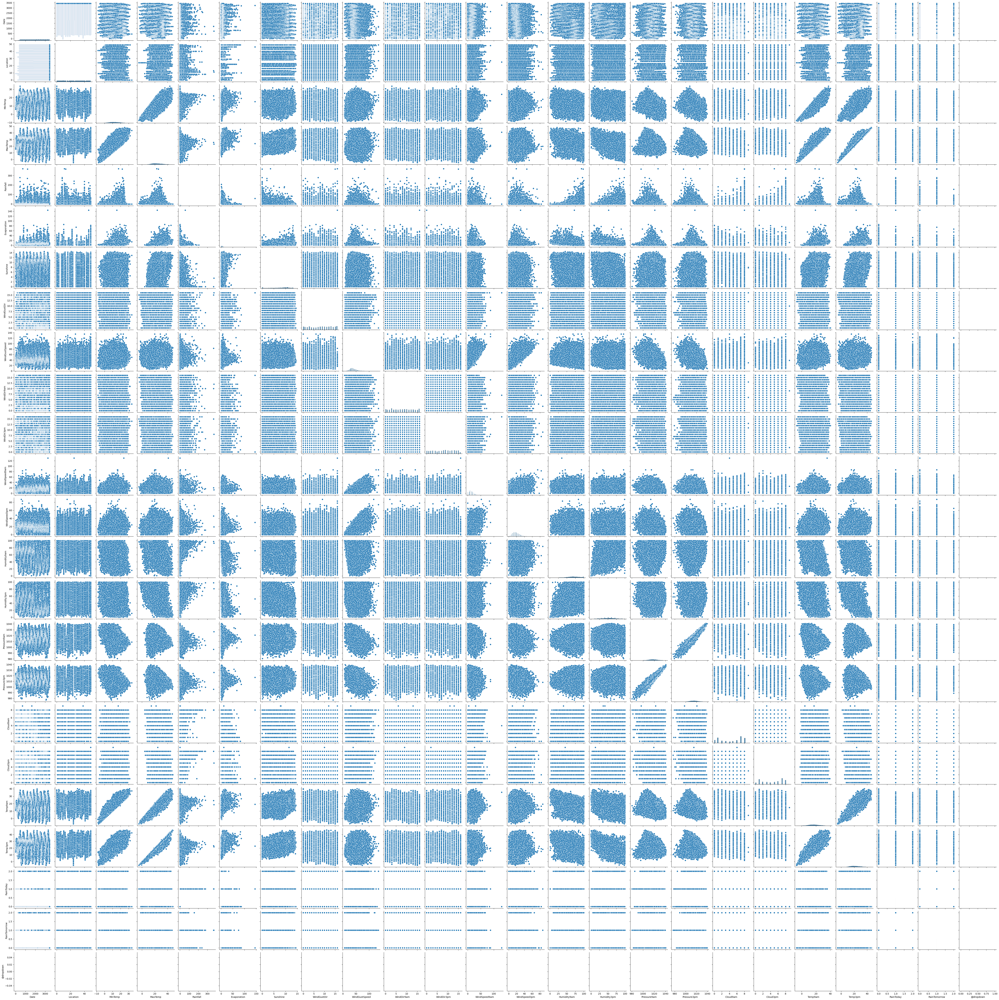

In [6]:
sns.pairplot(data)

<Axes: >

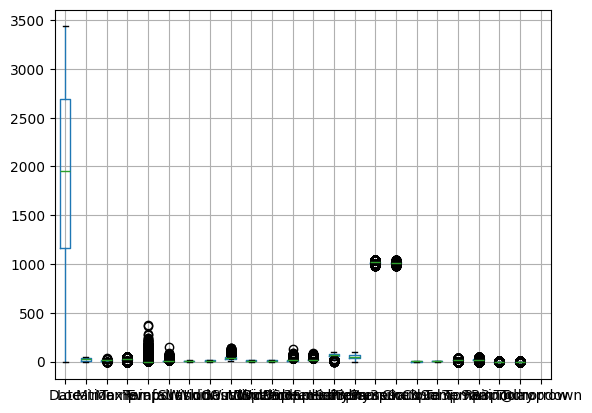

In [7]:
data.boxplot()

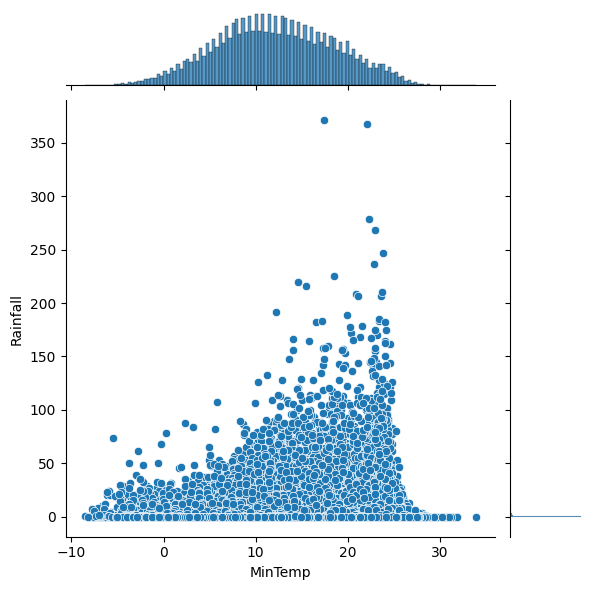

In [8]:
sns.jointplot(x="MinTemp", y="Rainfall", data=data, kind='scatter')
plt.show()

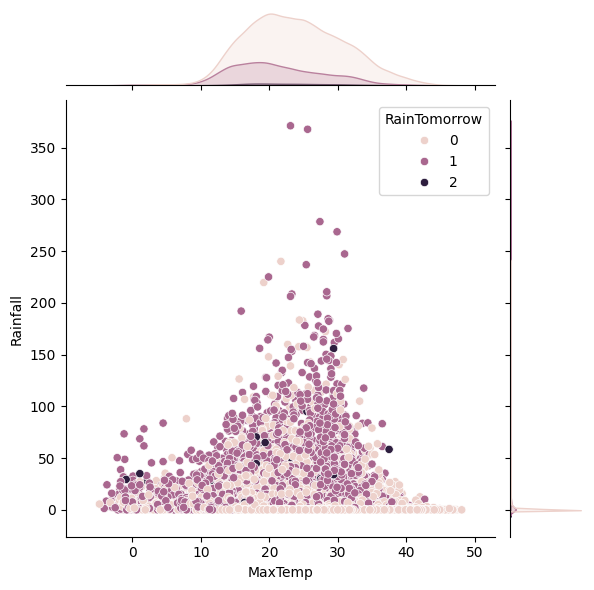

In [9]:
sns.jointplot(
    x='MaxTemp', 
    y='Rainfall', 
    data=data, 
    hue='RainTomorrow',  # hue should be the column name as a string
    kind='scatter'
)
plt.show()

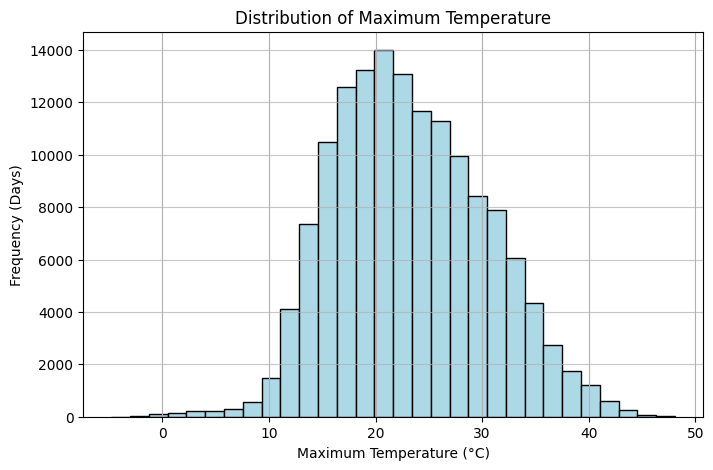

In [19]:



# To get the histogram for Maximum Temperature:
plt.figure(figsize=(8, 5))

# Use .hist() for a histogram on a numeric column
data['MaxTemp'].hist(bins=30, edgecolor='black', color='lightblue') 

plt.title('Distribution of Maximum Temperature')
plt.xlabel('Maximum Temperature (°C)')
plt.ylabel('Frequency (Days)')
plt.grid(axis='y', alpha=0.7)
plt.show()



<Axes: xlabel='RainTomorrow', ylabel='count'>

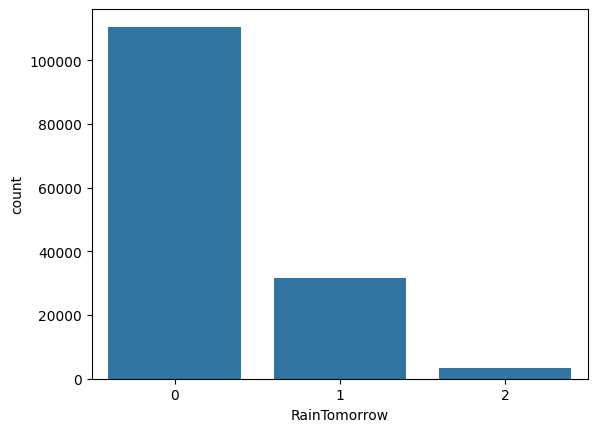

In [25]:
sns.countplot(x="RainTomorrow",data=data)

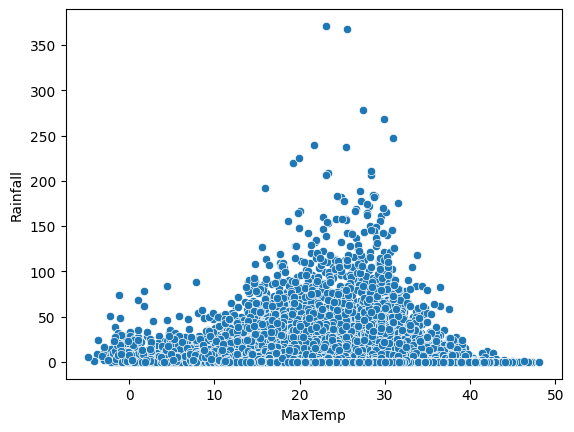

In [29]:
sns.scatterplot(
    x='MaxTemp', 
    y='Rainfall', 
    data=data, 
    
)
plt.show()

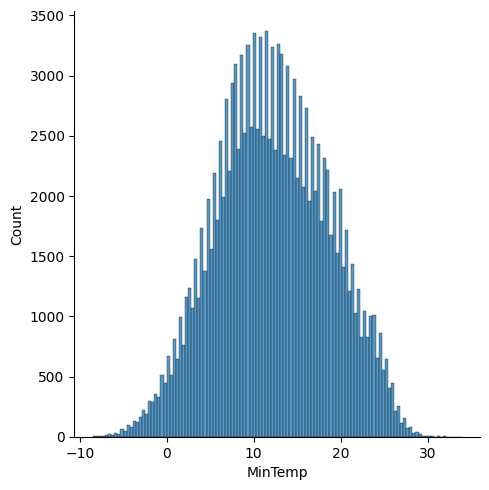

In [30]:
sns.displot(data['MinTemp'])